# Imports

In [1]:
import numpy as np
import pandas as pd
from datetime import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
import time


from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import inspect
import warnings
warnings.filterwarnings("ignore")

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
plt.style.use('seaborn-colorblind')
sns.set_theme()
%matplotlib inline
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (20, 10),
          'figure.titlesize': 'x-large',
          'figure.dpi': 150,
         'axes.labelsize': 'x-large',
         'axes.titlesize': 'x-large',
         'xtick.labelsize': 'x-large',
         'ytick.labelsize': 'x-large',
         'savefig.bbox': 'tight'}

plt.rcParams.update(params)
# plt.rcParams.keys() ### Use to check the available parameters

In [2]:
%run ts_processing.py
%run ts_modelling.py

In [3]:
df = pd.read_csv("NordPool/Spot_Price_Nordics.csv")
df.drop('Unnamed: 0', axis=1, inplace=True)
df['datetime']= pd.to_datetime(df['datetime'])

In [4]:
#### Check values in Last period, 2021-12-17 00:00:00 to 2022-03-12 23:00:00
test_size = 96 # 4 days
train_size = 1968 # 82 days
df.iloc[len(df)-(test_size+train_size):].tail()

,NO1,datetime,NO3,NO5,SE1,SE3,SE4,DK1,DK2,weekday,week,day,hour
45499,204.15,2022-03-12 19:00:00,14.09,204.15,17.03,204.15,204.15,210.25,210.25,5,10,12,19
45500,198.64,2022-03-12 20:00:00,14.14,198.64,16.08,198.64,198.64,204.13,198.64,5,10,12,20
45501,183.74,2022-03-12 21:00:00,14.24,183.74,15.82,168.85,168.85,173.00,170.43,5,10,12,21
45502,182.15,2022-03-12 22:00:00,14.24,182.15,15.59,123.77,123.77,176.50,153.95,5,10,12,22
45503,182.95,2022-03-12 23:00:00,14.34,182.95,15.55,103.01,103.01,182.51,173.39,5,10,12,23


In [5]:
####### Initialize data for the predictions ########
df = df.iloc[len(df)-(test_size+train_size):]
regions = ['NO1', 'NO3', 'NO5', 'SE1', 'SE3', 'SE4', 'DK1', 'DK2']
preds = []
rmse = []
indexes = []

Region NO1:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                 1968
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 24)   Log Likelihood                3781.736
Date:                             Sun, 12 Jun 2022   AIC                          -7557.472
Time:                                     16:05:23   BIC                          -7540.793
Sample:                                          0   HQIC                         -7551.335
                                            - 1968                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.0203      0.007      2.948      0.003       0.007       0.034
ar.S.L24      -

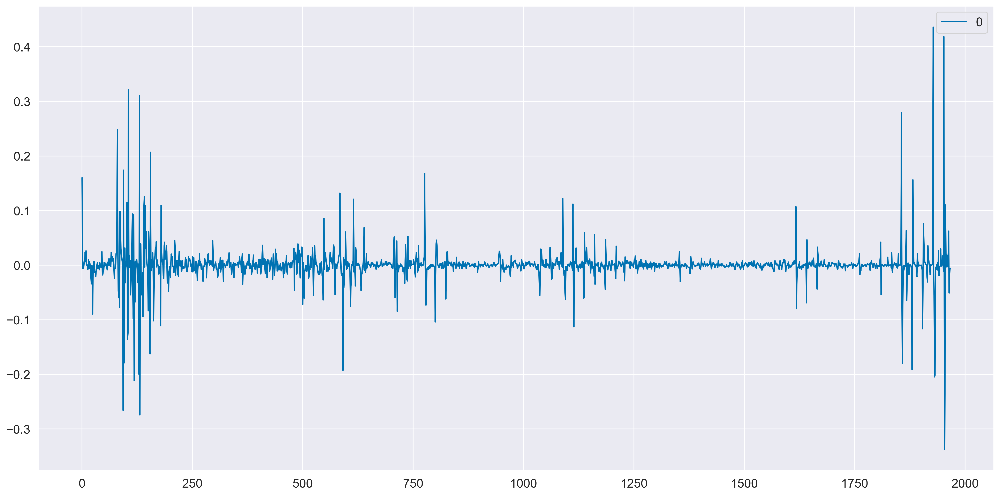

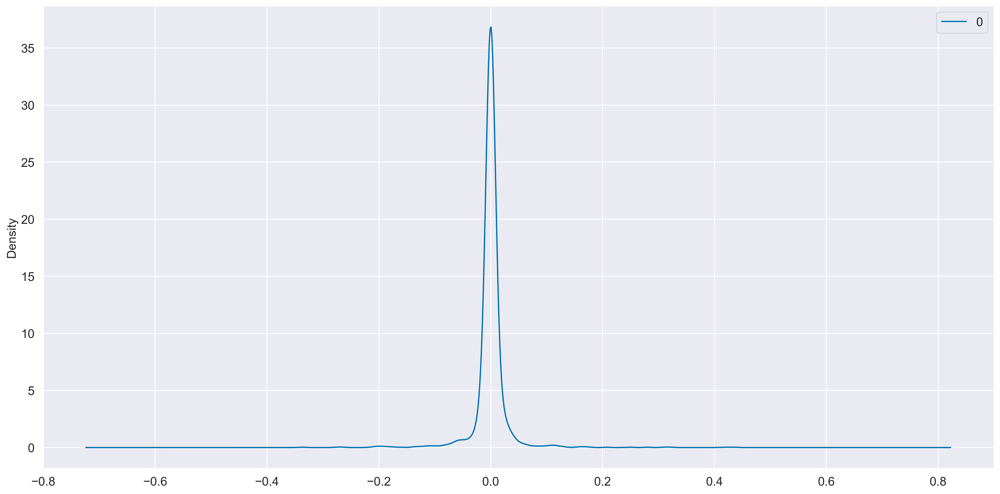

                 0
count  1968.000000
mean      0.000050
std       0.033614
min      -0.337277
25%      -0.003885
50%       0.000043
75%       0.004000
max       0.435896
Region NO3:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                 1968
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 24)   Log Likelihood                3803.485
Date:                             Sun, 12 Jun 2022   AIC                          -7600.969
Time:                                     16:05:27   BIC                          -7584.291
Sample:                                          0   HQIC                         -7594.832
                                            - 1968                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--

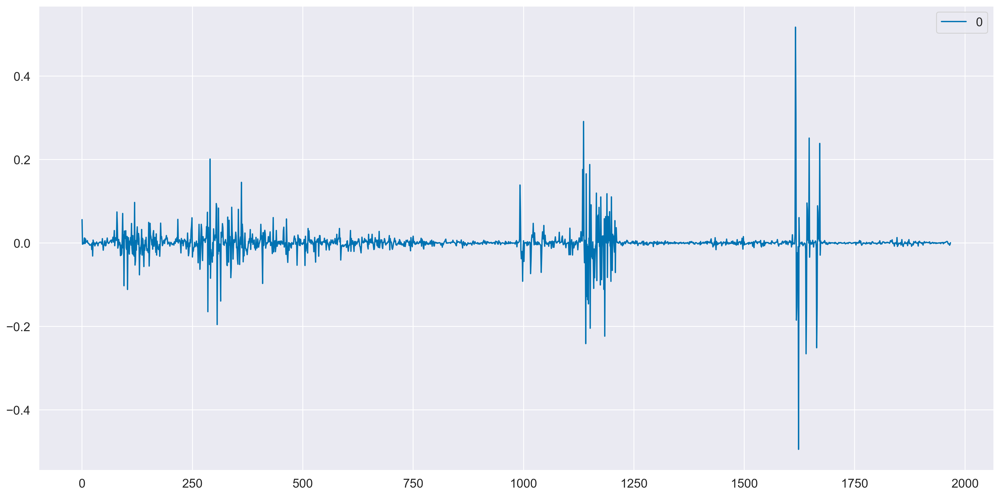

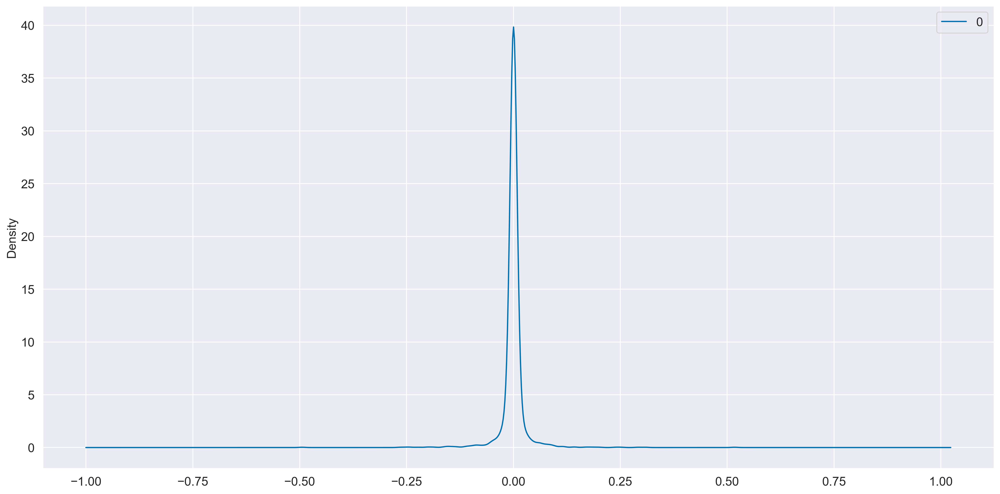

                 0
count  1968.000000
mean      0.000016
std       0.032975
min      -0.494434
25%      -0.002669
50%       0.000212
75%       0.003087
max       0.517263
Region NO5:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                 1968
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 24)   Log Likelihood                3907.729
Date:                             Sun, 12 Jun 2022   AIC                          -7809.458
Time:                                     16:05:34   BIC                          -7792.779
Sample:                                          0   HQIC                         -7803.321
                                            - 1968                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--

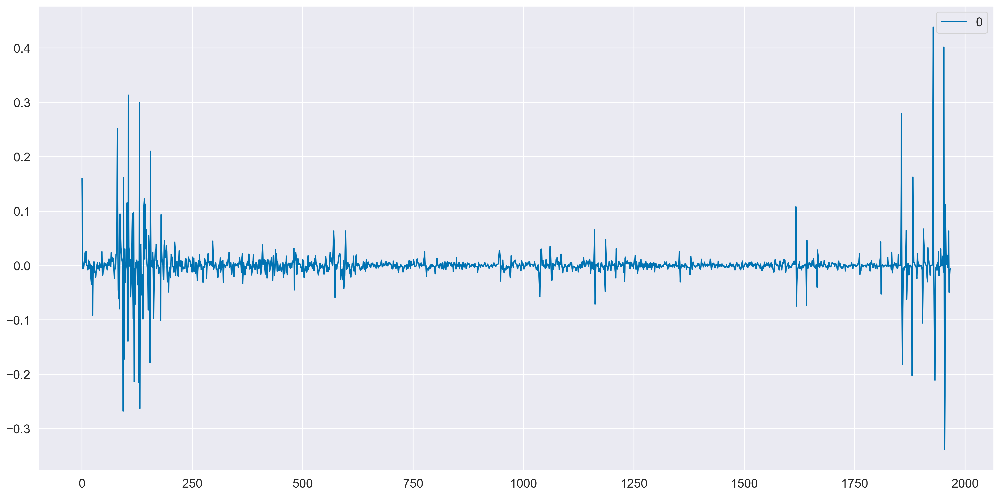

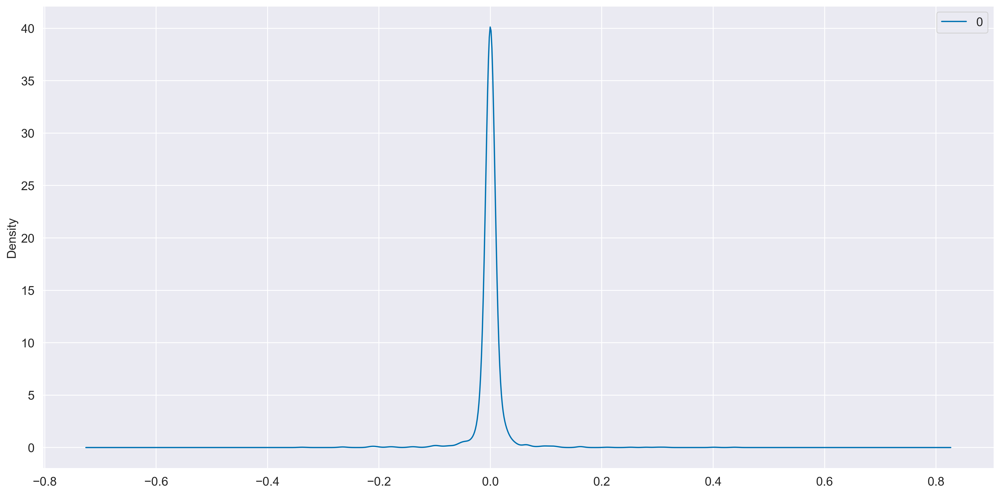

                 0
count  1968.000000
mean      0.000052
std       0.031521
min      -0.338014
25%      -0.003643
50%       0.000014
75%       0.003742
max       0.438316
Region SE1:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                 1968
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 24)   Log Likelihood                3343.905
Date:                             Sun, 12 Jun 2022   AIC                          -6681.811
Time:                                     16:05:41   BIC                          -6665.132
Sample:                                          0   HQIC                         -6675.674
                                            - 1968                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--

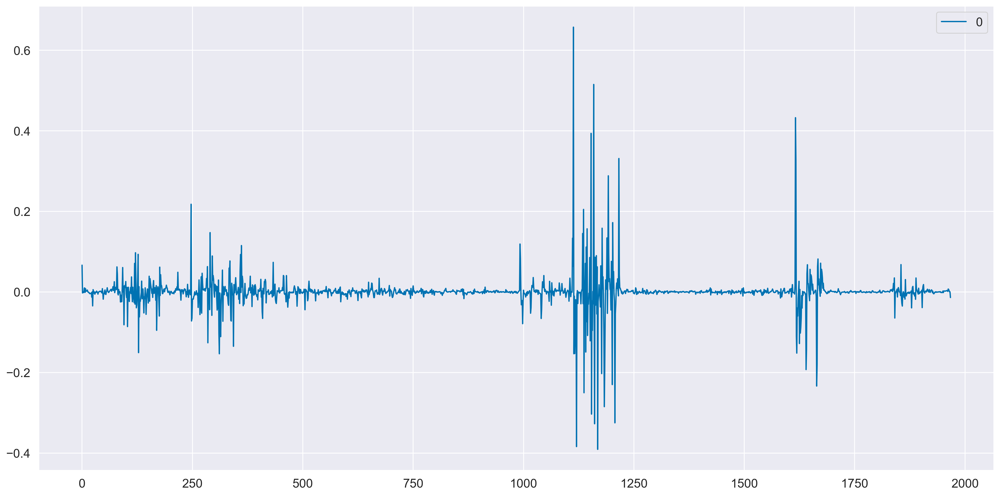

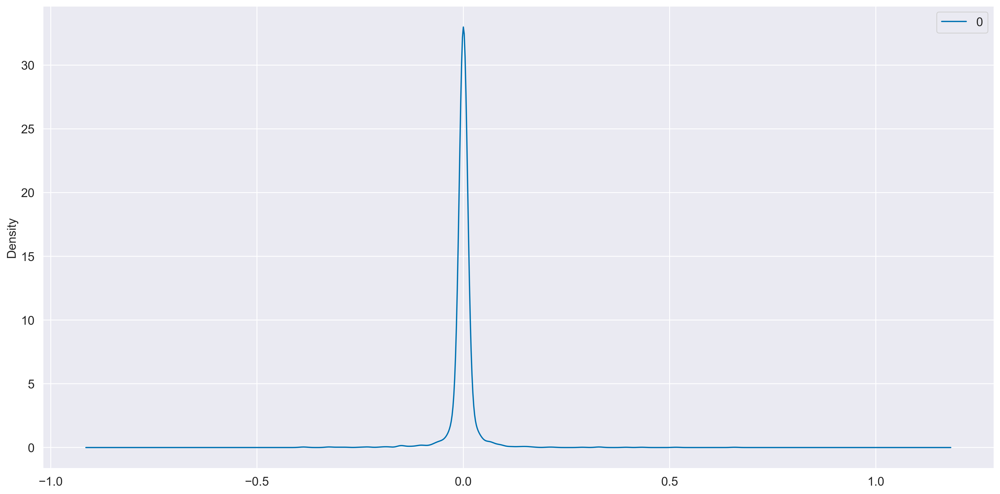

                 0
count  1968.000000
mean      0.000028
std       0.041884
min      -0.390679
25%      -0.002645
50%       0.000193
75%       0.003230
max       0.657310
Region SE3:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                 1968
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 24)   Log Likelihood                3410.746
Date:                             Sun, 12 Jun 2022   AIC                          -6815.492
Time:                                     16:05:48   BIC                          -6798.813
Sample:                                          0   HQIC                         -6809.355
                                            - 1968                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--

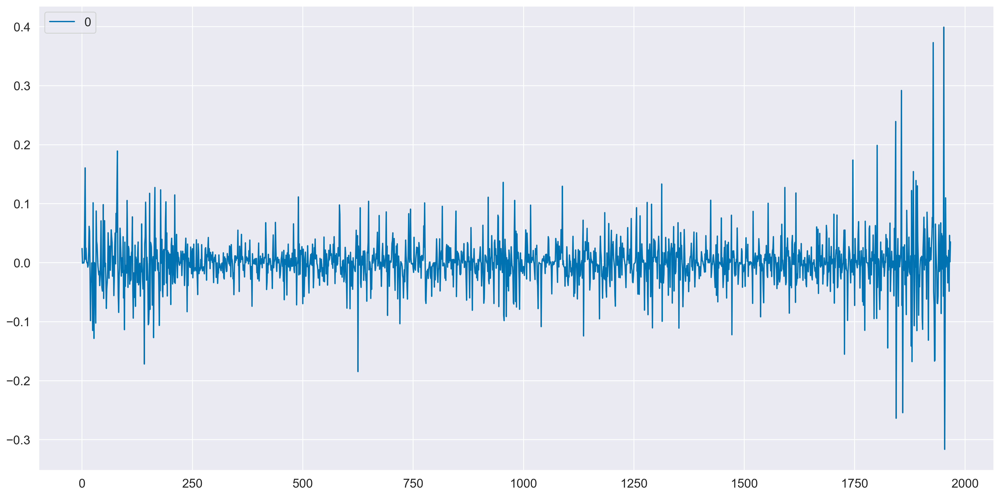

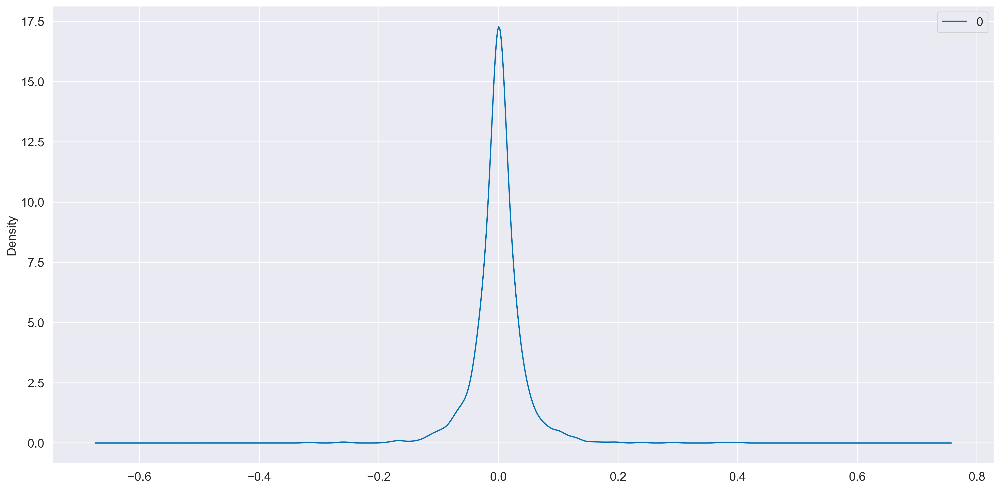

                 0
count  1968.000000
mean      0.000074
std       0.041295
min      -0.316406
25%      -0.014988
50%       0.000249
75%       0.014850
max       0.399220
Region SE4:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                 1968
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 24)   Log Likelihood                3307.192
Date:                             Sun, 12 Jun 2022   AIC                          -6608.383
Time:                                     16:05:55   BIC                          -6591.705
Sample:                                          0   HQIC                         -6602.246
                                            - 1968                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--

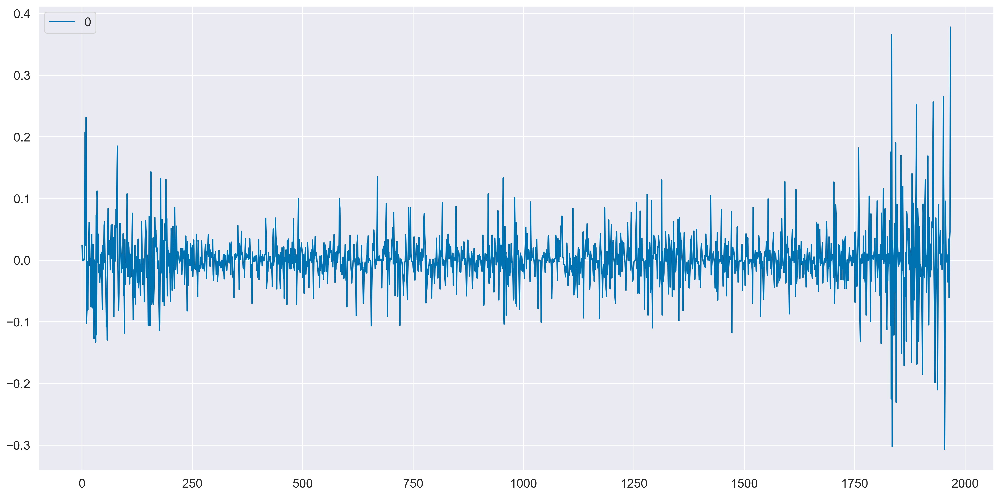

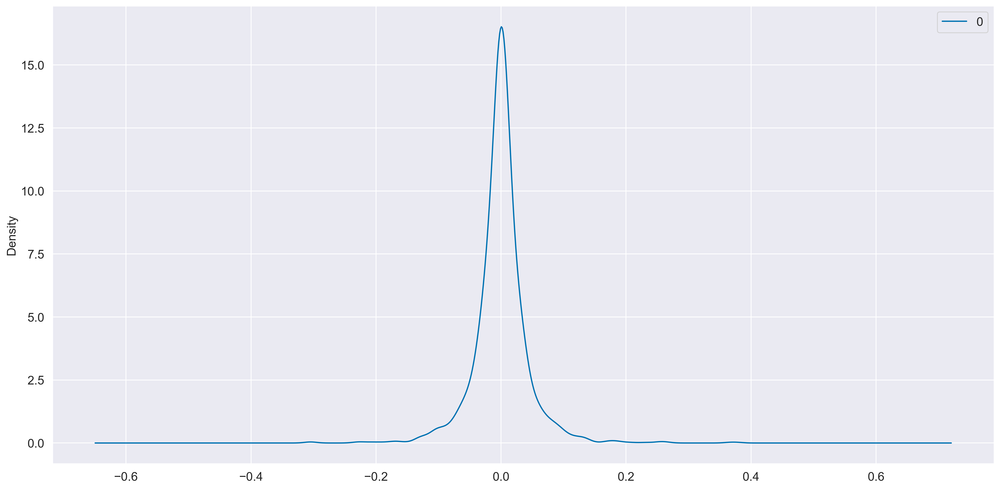

                 0
count  1968.000000
mean      0.000227
std       0.044112
min      -0.306919
25%      -0.016120
50%       0.000138
75%       0.015068
max       0.377883
Region DK1:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                 1968
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 24)   Log Likelihood                3840.571
Date:                             Sun, 12 Jun 2022   AIC                          -7675.141
Time:                                     16:06:01   BIC                          -7658.462
Sample:                                          0   HQIC                         -7669.004
                                            - 1968                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--

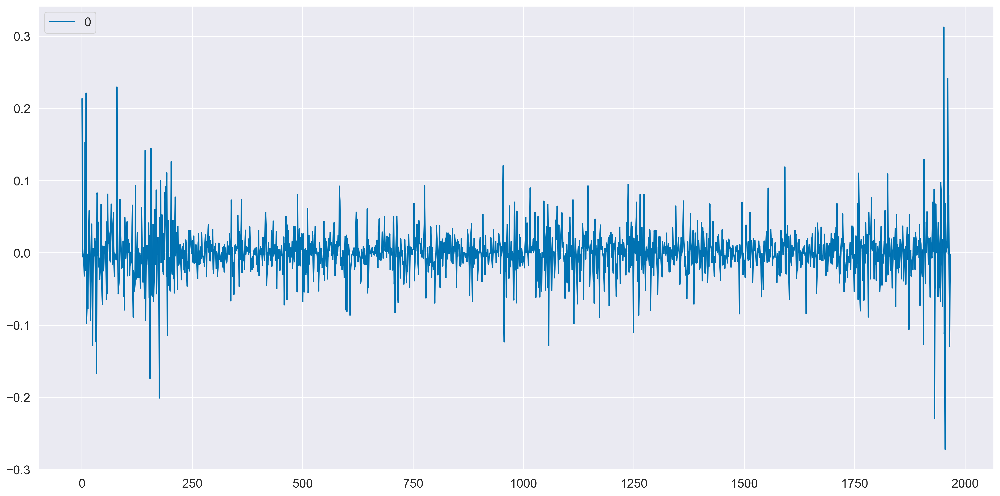

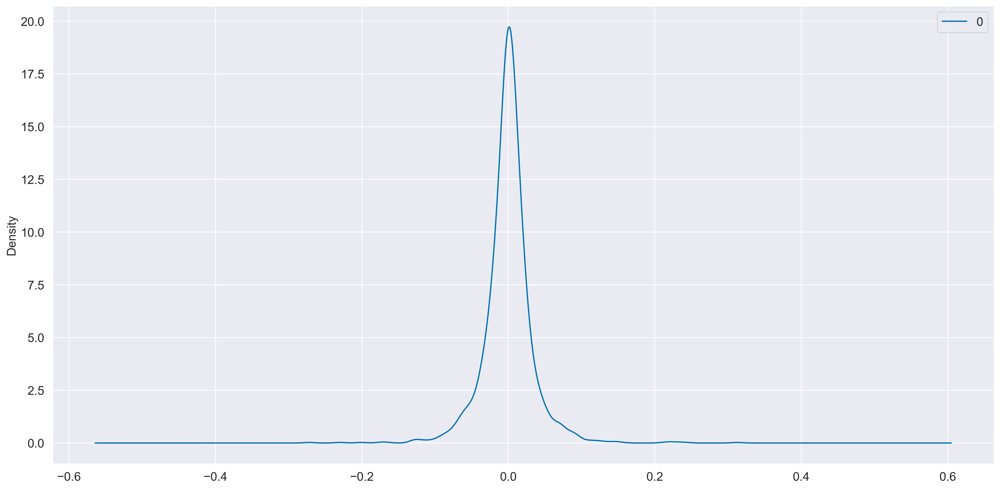

                 0
count  1968.000000
mean      0.000084
std       0.034244
min      -0.271992
25%      -0.013542
50%       0.000327
75%       0.013344
max       0.312545
Region DK2:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                 1968
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 24)   Log Likelihood                3679.376
Date:                             Sun, 12 Jun 2022   AIC                          -7352.753
Time:                                     16:06:07   BIC                          -7336.074
Sample:                                          0   HQIC                         -7346.616
                                            - 1968                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--

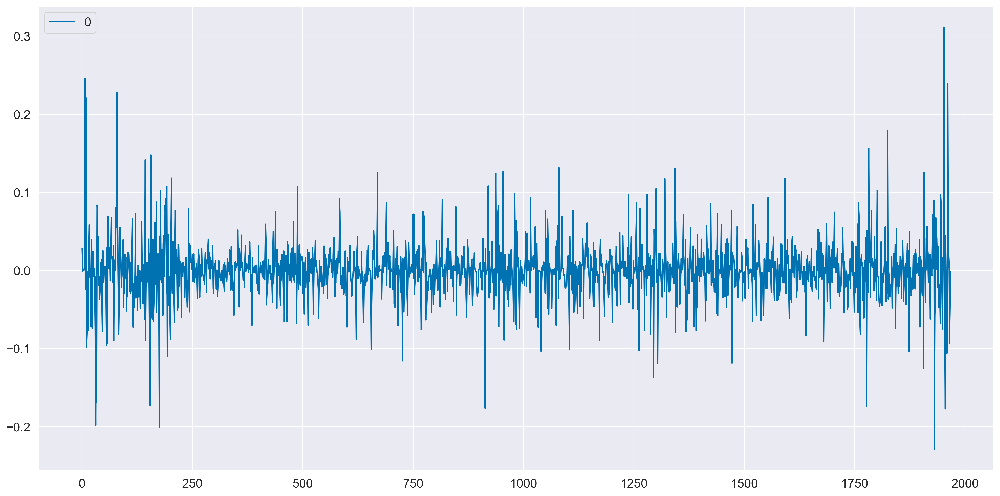

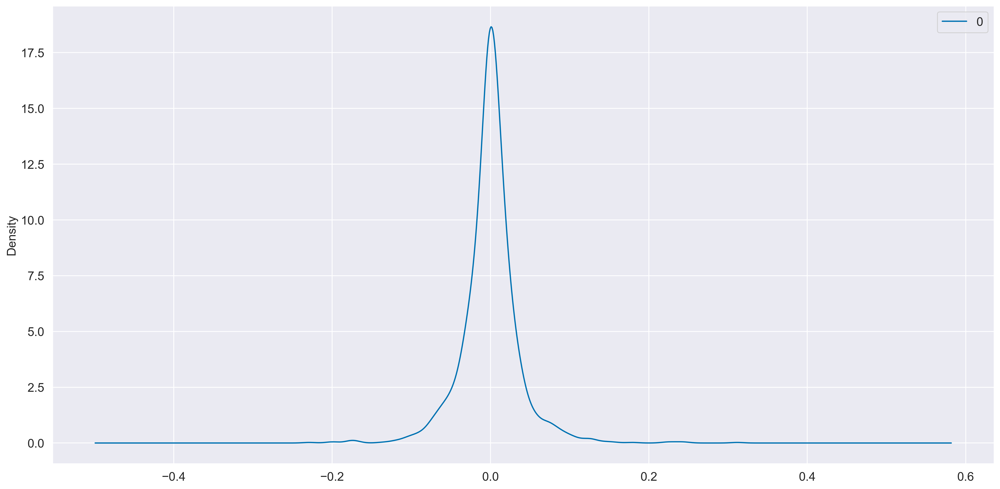

                 0
count  1968.000000
mean      0.000034
std       0.036951
min      -0.228952
25%      -0.014505
50%       0.000319
75%       0.014497
max       0.311533


In [6]:
order=(0,1,1)
seasonal_order = (1,1,0,24)
rmse={}
preds={}
df_test = df[train_size:]
for region in regions: 
        data = df[:train_size][region]
        
        p_min = data.min()
        p_max = data.max()
        ndata = (data-p_min)/(p_max-p_min)
        print(f'Region {region}:')
        
        mod = sm.tsa.statespace.SARIMAX(ndata.values, order = order,
                                           seasonal_order = seasonal_order,
                                           enforce_stationarity = False,
                                           enforce_invertibility  = False)
        results = mod.fit()
        """ Useful to dig into a specific model
        It shows the summary statistics, the residuals
        and how it compares to the normal distribution
        """
        print(results.summary())
        ## line plot of residuals
        residuals = pd.DataFrame(results.resid)
        residuals.plot()
        plt.show()
        ## density plot of residuals
        residuals.plot(kind='kde')
        plt.show()
        ## summary stats of residuals
        print(residuals.describe())
        #break
        preds[f'{region}'] = results.forecast(steps = test_size)
    

# Evaluation

## De-Normalization

In [11]:
npreds_df=pd.DataFrame(preds)
denorm = lambda x: x * (p_max - p_min) + p_min
preds_df = npreds_df[regions].apply(denorm)

In [12]:
preds_df

,NO1,NO3,NO5,SE1,SE3,SE4,DK1,DK2
0,189.068872,27.982875,189.197776,49.571604,191.583524,468.508864,461.207418,460.543078
1,201.847716,29.442698,202.967828,50.811690,222.746917,485.896098,477.374707,477.944377
2,200.254397,29.524126,201.332096,51.589947,185.270626,482.757101,503.150872,504.543906
3,199.684795,29.185326,200.755284,53.088664,197.017417,480.787082,502.781060,504.186843
4,199.798754,29.109769,200.871363,54.988519,225.159490,489.438545,484.349194,485.540627
...,...,...,...,...,...,...,...,...
91,314.404920,52.185952,318.531466,98.657934,585.612271,1362.524650,870.570951,893.942350
92,298.614299,51.076094,302.002581,100.095247,571.412819,1347.972559,898.390945,916.306968
93,276.772824,48.397049,280.025723,100.363107,551.043124,1327.921972,826.950963,830.806302
94,270.611280,46.161202,273.810317,100.552762,542.827816,1319.641141,747.417444,751.067653


In [23]:
preds_df['datetime'] = df_test.index
preds_df = preds_df.merge(df_test, on='datetime', how='right', suffixes=['_sarima', None])
preds_df.to_csv('Plots/SARIMA_regions/Preds_sarima_regions.csv')

## Plotting

In [18]:
df.set_index('datetime', inplace=True)
df_test.set_index('datetime', inplace=True)

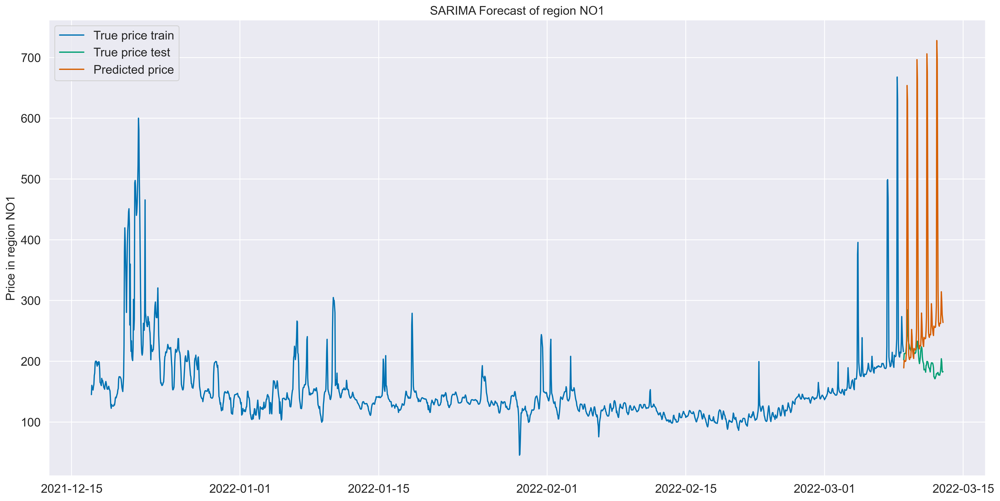

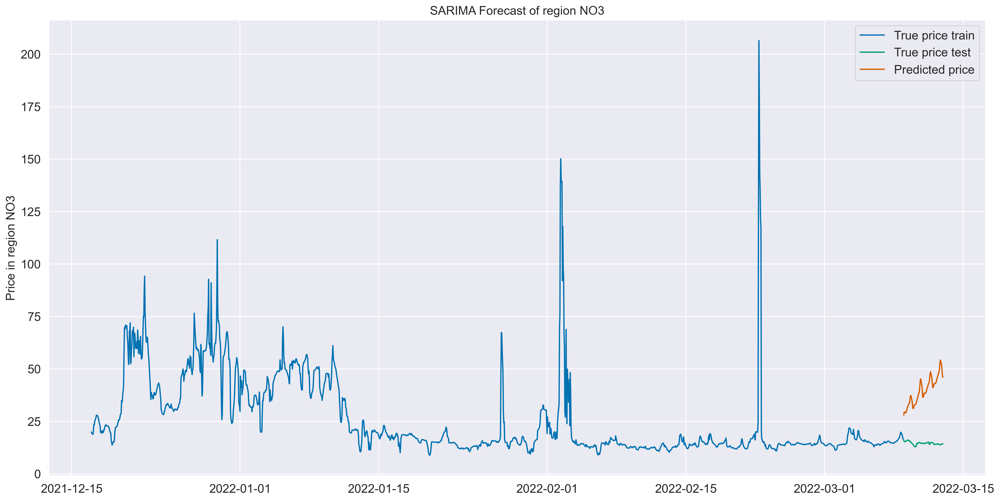

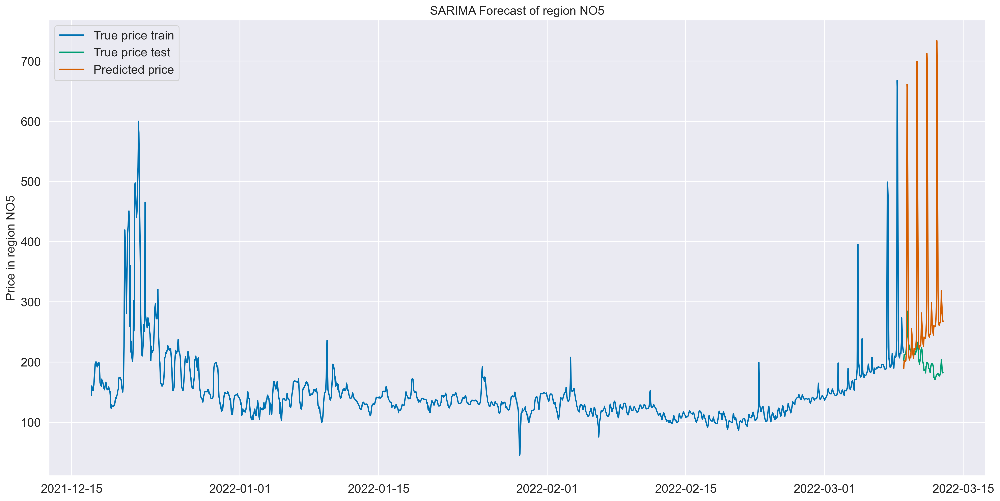

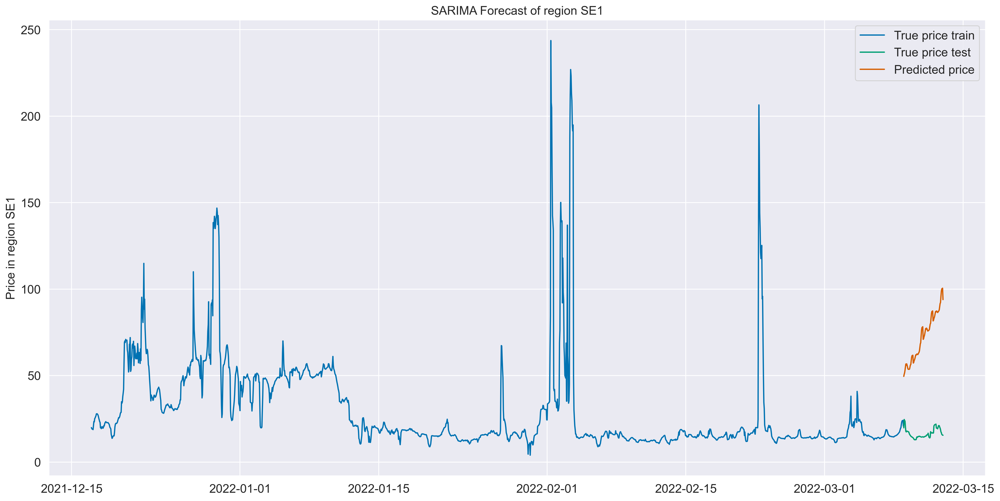

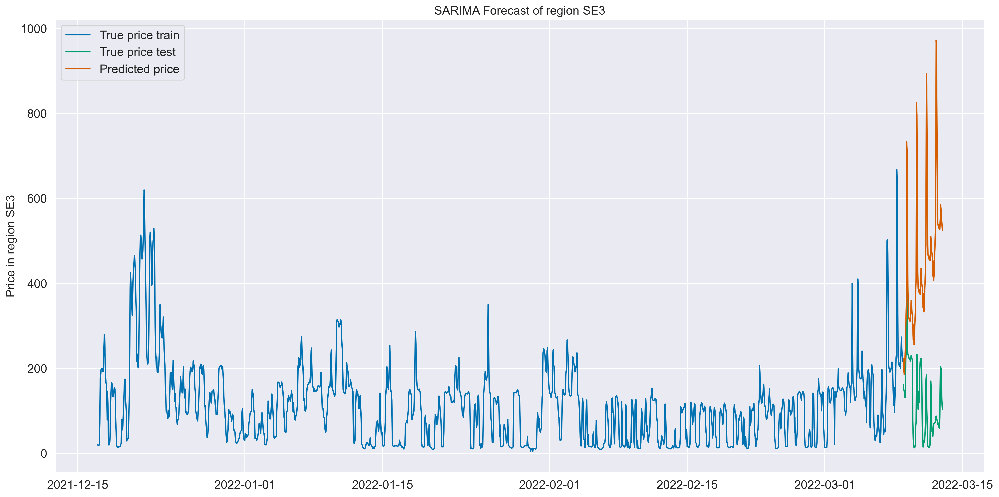

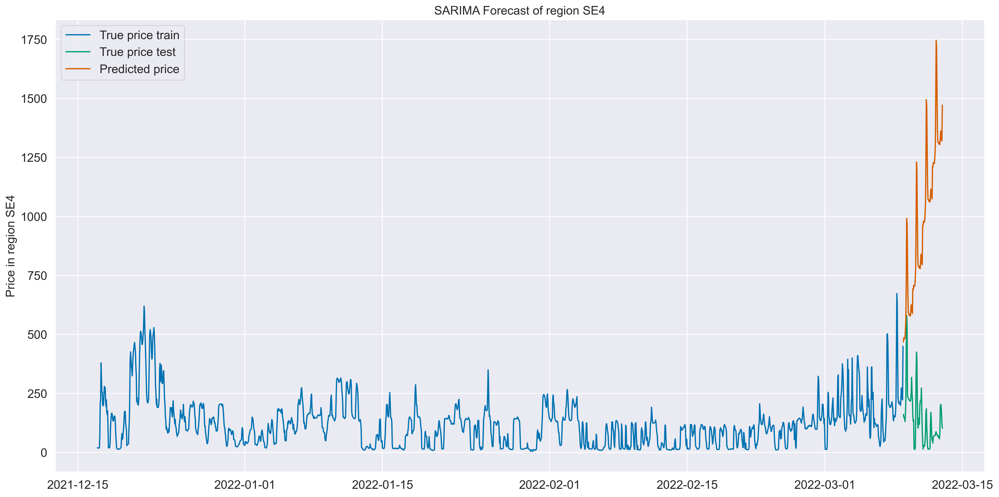

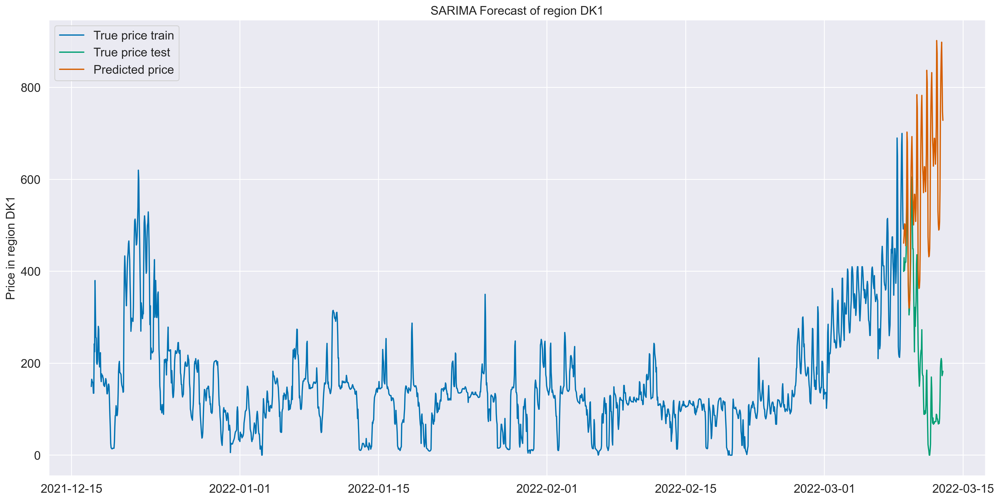

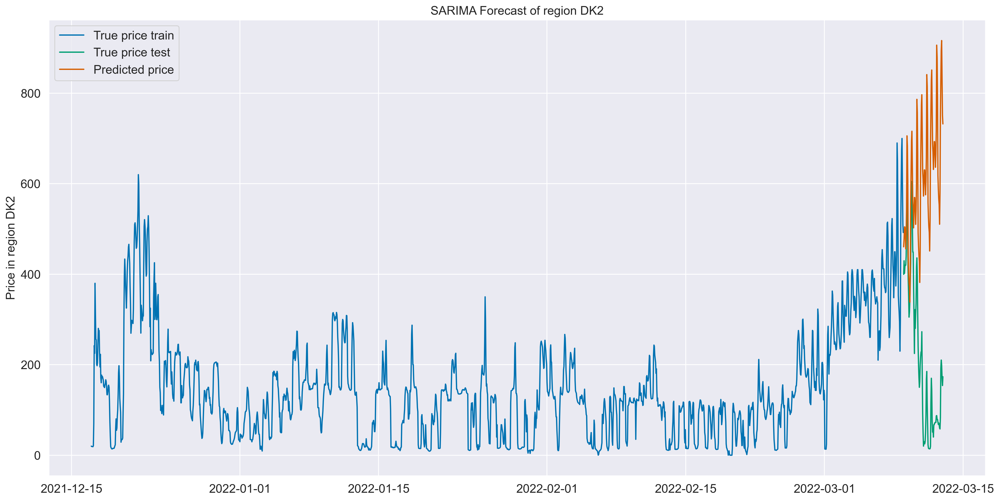

In [20]:
for region in regions:
    fig = plt.figure(figsize=(20,10))
    plt.plot(df[:train_size][region], label = "True price train")
    plt.plot(df_test[region], label = "True price test")
    plt.plot(df_test.index, preds_df[f'{region}_sarima'], label = "Predicted price")
    plt.title(f'SARIMA Forecast of region {region}')
    plt.legend()
    plt.ylabel(f'Price in region {region}')
    fig.savefig(f'Plots/Pred SARIMA region {region}.jpg')
    plt.show()

## Errors

In [25]:
regions = ['NO1', 'NO3', 'NO5', 'SE1', 'SE3', 'SE4', 'DK1', 'DK2']
rmse = {}
mape = {}
for reg in regions:
    rmse[reg]=(np.sqrt(mean_squared_error(preds_df[reg], preds_df[f'{reg}_sarima'])))
    mape[reg]=calculate_mape(preds_df[reg], preds_df[f'{reg}_sarima'])
    print(f'Region {reg}, RMSE: {rmse[reg]} , MAPE: {mape[reg]}')


Region NO1, RMSE: 154.18189862159628 , MAPE: 44.78066850544399
Region NO3, RMSE: 26.071033650284086 , MAPE: 173.89370123766545
Region NO5, RMSE: 156.13255099481066 , MAPE: 45.67435467019447
Region SE1, RMSE: 57.41022624390431 , MAPE: 342.706023867754
Region SE3, RMSE: 369.37057311317653 , MAPE: 652.2044090163341
Region SE4, RMSE: 911.9757224595247 , MAPE: 1569.4335397561063
Region DK1, RMSE: 440.0765179689306 , MAPE: 10840.11255121146
Region DK2, RMSE: 465.17097266350333 , MAPE: 677.131189251437


In [26]:
print(rmse)

{'NO1': 154.18189862159628, 'NO3': 26.071033650284086, 'NO5': 156.13255099481066, 'SE1': 57.41022624390431, 'SE3': 369.37057311317653, 'SE4': 911.9757224595247, 'DK1': 440.0765179689306, 'DK2': 465.17097266350333}
